In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score, GridSearchCV

In [2]:
df=pd.read_csv('winequalityN.csv')
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [4]:
df.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [5]:
import pandas_profiling as pdp

In [6]:
dfx=pdp.ProfileReport(df)
dfx

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
data = df.dropna()


In [8]:
from sklearn.model_selection import train_test_split
Y = data['type']
X = data.drop(columns=['type', 'quality'])
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=9)

In [9]:


#y_train_5 = (Y_train == 6)
#y_test_5 = (Y_test == 6)



In [10]:
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier



from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, ConfusionMatrixDisplay

In [11]:
# Scaling the values

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [12]:
models = {}
# Logistic Regression
lr = LogisticRegression()
models["Logistic Regression"] = lr
# KNN
knn = KNeighborsClassifier()
models["K Neighbors Classifier"] = knn
# SVC
svc = SVC(kernel="linear")
models["Support Vector Classifier"] = svc
# Decision Tree Classifier
dtc = DecisionTreeClassifier()
models["Decision Tree Classifier"] = dtc
rf = RandomForestClassifier(n_estimators=10, criterion="entropy",random_state=0)
models["Random Forest"] = rf

In [13]:
for model in models:
    models[model].fit(X_train,Y_train)

In [14]:
def model_performance(modelName,model,X_test,Y_test):
    print("_______________________________________________")    
    print("Model:",modelName)
    y_pred = model.predict(X_test)
    print("Accuracy Score:",accuracy_score(Y_test,y_pred))
    cm = confusion_matrix(Y_test,y_pred)
    print("Confusion Matrix:\n",cm)
    cmd = ConfusionMatrixDisplay(cm,display_labels=["white","red"])
    cmd.plot()
    print("Classification Report:\n",classification_report(Y_test,y_pred))
    plt.show()
    print("_______________________________________________")

_______________________________________________
Model: Logistic Regression
Accuracy Score: 0.9948427024239299
Confusion Matrix:
 [[ 492    5]
 [   5 1437]]
Classification Report:
               precision    recall  f1-score   support

         red       0.99      0.99      0.99       497
       white       1.00      1.00      1.00      1442

    accuracy                           0.99      1939
   macro avg       0.99      0.99      0.99      1939
weighted avg       0.99      0.99      0.99      1939



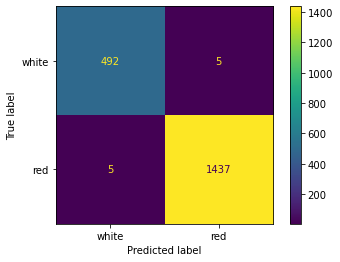

_______________________________________________
_______________________________________________
Model: K Neighbors Classifier
Accuracy Score: 0.9953584321815369
Confusion Matrix:
 [[ 492    5]
 [   4 1438]]
Classification Report:
               precision    recall  f1-score   support

         red       0.99      0.99      0.99       497
       white       1.00      1.00      1.00      1442

    accuracy                           1.00      1939
   macro avg       0.99      0.99      0.99      1939
weighted avg       1.00      1.00      1.00      1939



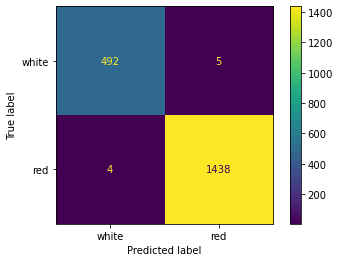

_______________________________________________
_______________________________________________
Model: Support Vector Classifier
Accuracy Score: 0.9953584321815369
Confusion Matrix:
 [[ 493    4]
 [   5 1437]]
Classification Report:
               precision    recall  f1-score   support

         red       0.99      0.99      0.99       497
       white       1.00      1.00      1.00      1442

    accuracy                           1.00      1939
   macro avg       0.99      0.99      0.99      1939
weighted avg       1.00      1.00      1.00      1939



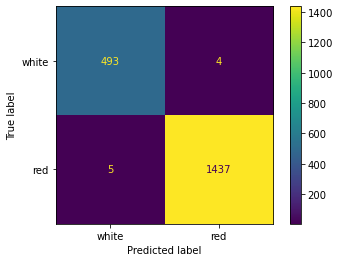

_______________________________________________
_______________________________________________
Model: Decision Tree Classifier
Accuracy Score: 0.9850438370293966
Confusion Matrix:
 [[ 482   15]
 [  14 1428]]
Classification Report:
               precision    recall  f1-score   support

         red       0.97      0.97      0.97       497
       white       0.99      0.99      0.99      1442

    accuracy                           0.99      1939
   macro avg       0.98      0.98      0.98      1939
weighted avg       0.99      0.99      0.99      1939



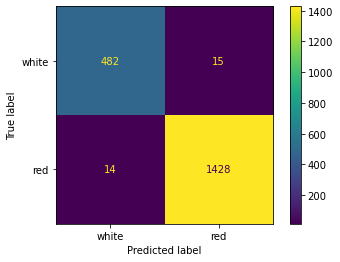

_______________________________________________
_______________________________________________
Model: Random Forest
Accuracy Score: 0.9902011346054668
Confusion Matrix:
 [[ 484   13]
 [   6 1436]]
Classification Report:
               precision    recall  f1-score   support

         red       0.99      0.97      0.98       497
       white       0.99      1.00      0.99      1442

    accuracy                           0.99      1939
   macro avg       0.99      0.98      0.99      1939
weighted avg       0.99      0.99      0.99      1939



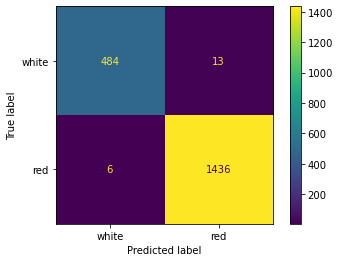

_______________________________________________


In [15]:
for model in models:
    model_performance(model,models[model],X_test,Y_test)

In [18]:
data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6491,red,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [19]:
y= data['quality']
x = data.drop(columns=['type', 'quality'])
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=9)

In [20]:
y_train_5 = (Y_train == 5)
y_test_5 = (Y_test == 5)


In [21]:
y_train_5.value_counts()

False    3037
True     1487
Name: quality, dtype: int64

In [25]:
from sklearn.linear_model import SGDClassifier
sgd_clf = SGDClassifier(max_iter=1000, tol=1e-3, random_state=42)
sgd_clf.fit(X_train, y_train_5)

SGDClassifier(random_state=42)

In [26]:
from sklearn.model_selection import cross_val_predict

y_train_pred = cross_val_predict(sgd_clf, X_train, y_train_5, cv=3)

In [27]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_train_5, y_train_pred)

array([[2937,  100],
       [1339,  148]], dtype=int64)

In [28]:
from sklearn.metrics import precision_score, recall_score

precision_score(y_train_5, y_train_pred)

0.5967741935483871

In [29]:
recall_score(y_train_5, y_train_pred)

0.09952925353059852